In [1]:
import numpy as np
import pandas as pd
import music21 as m21
import math
import mido
import librosa
import matplotlib.pyplot as plt
from matplotlib.collections import PatchCollection
from matplotlib.patches import Rectangle
from pathlib import Path
from IPython.display import Audio, FileLink, display

# One Man's Dream - Yanni

In [2]:
AUDIO_PATH = Path("Musics") / "Yanni - One Man's Dream.mp3"

# Play the original MP3 file in the notebook.
display(Audio(filename=str(AUDIO_PATH)))

## Waveform Representations

### 1. Raw Waveform

In [3]:
BPM, BEATS_PER_MEASURE, N_MEASURES = 120, 4, 9
SECONDS_PER_MEASURE = 60 / BPM * BEATS_PER_MEASURE
ANALYSIS_DURATION = N_MEASURES * SECONDS_PER_MEASURE  # 18 seconds
HOP_LENGTH, N_FFT, N_MELS = 512, 2048, 128

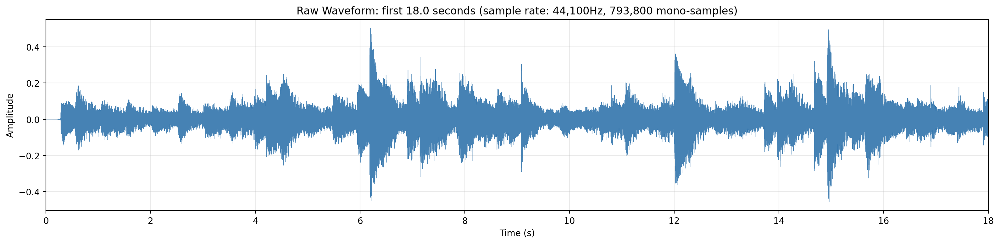

In [4]:
y, sample_rate = librosa.load(AUDIO_PATH, sr=None, mono=True, duration=ANALYSIS_DURATION)
time_axis = np.arange(len(y)) / sample_rate

plt.figure(figsize=(16, 4))
plt.plot(time_axis, y, color="steelblue", linewidth=0.5)
plt.xlim(0, ANALYSIS_DURATION)
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.title(f"Raw Waveform: first {ANALYSIS_DURATION} seconds (sample rate: {sample_rate:,}Hz, {len(y):,} mono-samples)")
plt.grid(alpha=0.25)
plt.tight_layout()
plt.show()

### 2. Chromagram

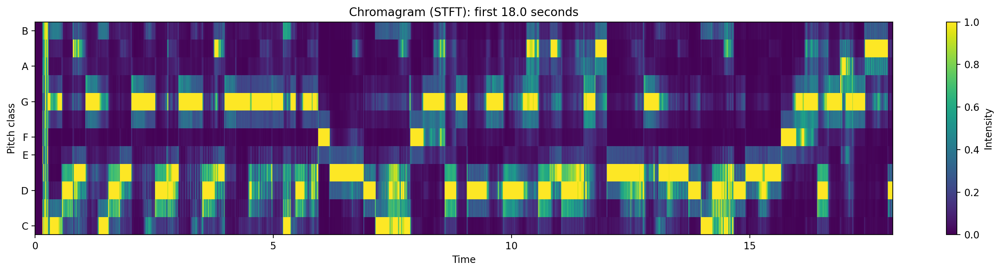

In [5]:
# Compute the chromagram using the Short-Time Fourier Transform (STFT)
chroma = librosa.feature.chroma_stft(y=y, sr=sample_rate, n_fft=N_FFT, hop_length=HOP_LENGTH)

plt.figure(figsize=(16, 4))
librosa.display.specshow(chroma, sr=sample_rate, hop_length=HOP_LENGTH, x_axis="time", y_axis="chroma", cmap="viridis")
plt.colorbar(label="Intensity")
plt.xlim(0, ANALYSIS_DURATION)
plt.title(f"Chromagram (STFT): first {ANALYSIS_DURATION} seconds")
plt.tight_layout()
plt.show()

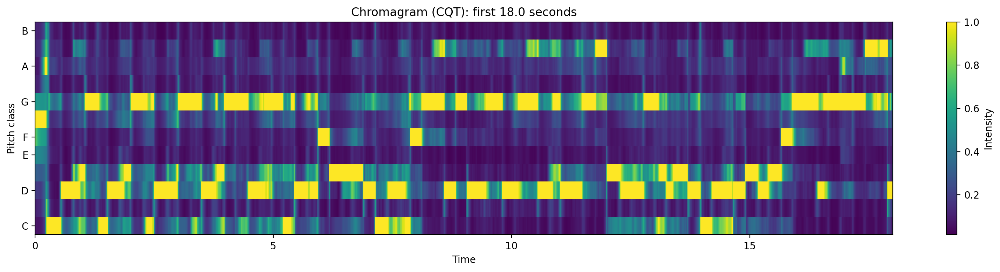

In [6]:
# Compute the chromagram using the Constant-Q Transform (CQT)
chroma = librosa.feature.chroma_cqt(y=y, sr=sample_rate, hop_length=HOP_LENGTH)

plt.figure(figsize=(16, 4))
librosa.display.specshow(chroma, sr=sample_rate, hop_length=HOP_LENGTH, x_axis="time", y_axis="chroma", cmap="viridis")
plt.colorbar(label="Intensity")
plt.xlim(0, ANALYSIS_DURATION)
plt.title(f"Chromagram (CQT): first {ANALYSIS_DURATION} seconds")
plt.tight_layout()
plt.show()

### 3. Spectrogram

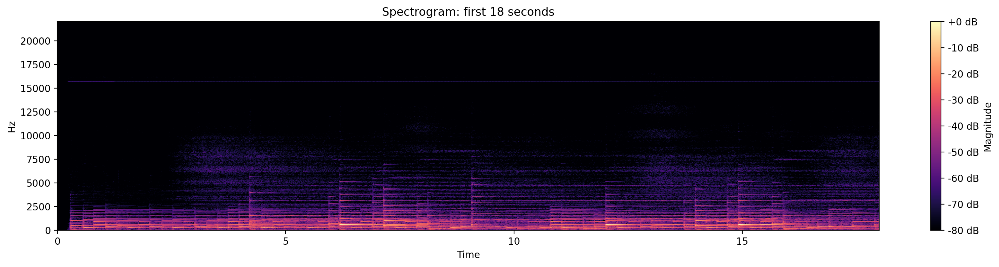

In [7]:
stft = librosa.stft(y, n_fft=N_FFT, hop_length=HOP_LENGTH)
spectrogram_db = librosa.amplitude_to_db(np.abs(stft), ref=np.max)

plt.figure(figsize=(16, 4))
librosa.display.specshow(spectrogram_db, sr=sample_rate, hop_length=HOP_LENGTH, x_axis="time", y_axis="hz", cmap="magma")
plt.colorbar(format="%+2.0f dB", label="Magnitude")
plt.xlim(0, ANALYSIS_DURATION)
plt.ylim(0, sample_rate / 2)
plt.title("Spectrogram: first 18 seconds")
plt.tight_layout()
plt.show()

### 4. Mel-Spectrogram

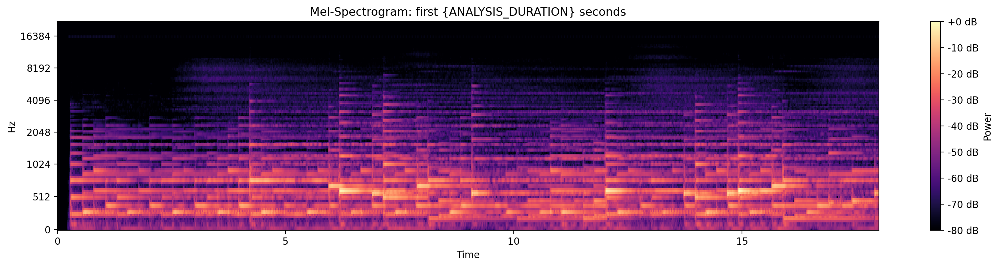

In [8]:
mel_spectrogram = librosa.feature.melspectrogram(y=y, sr=sample_rate, n_fft=N_FFT, hop_length=HOP_LENGTH, n_mels=N_MELS, fmax=sample_rate / 2)
mel_spectrogram_db = librosa.power_to_db(mel_spectrogram, ref=np.max)

plt.figure(figsize=(16, 4))
librosa.display.specshow(mel_spectrogram_db, sr=sample_rate, hop_length=HOP_LENGTH, x_axis="time", y_axis="mel", cmap="magma")
plt.colorbar(format="%+2.0f dB", label="Power")
plt.xlim(0, ANALYSIS_DURATION)
plt.title("Mel-Spectrogram: first {ANALYSIS_DURATION} seconds")
plt.tight_layout()
plt.show()

## Symbolic Representations

### 1. Music Score Notation

In [9]:
MIDI_PATH = Path("Musics") / "One Man's Dream.mid"

score = m21.converter.parse(str(MIDI_PATH))
score_excerpt = score.measures(1, 9)
score_excerpt.write("musicxml", fp=str(Path("Musics") / "One Man's Dream first 9 measures.musicxml"))

print(f"MusicXML written to: {Path("Musics") / "One Man's Dream first 9 measures.musicxml"}")
display(FileLink(str(Path("Musics") / "One Man's Dream first 9 measures.musicxml")))

MusicXML written to: Musics\One Man's Dream first 9 measures.musicxml


c:\Users\porip\Documents\Pouria Ar\PouriaEdu\University2\Master Thesis\Code\modules\utils\Music Representations\Musics\One Man's Dream first 9 measures.musicxml

### 2. MIDI Messages

In [10]:
midi = mido.MidiFile(str(MIDI_PATH))

merged_track = mido.merge_tracks(midi.tracks)
message_rows = []
note_events = []
active_notes = {}
absolute_seconds = 0.0
tempo = mido.bpm2tempo(BPM)

def midi_note_name(note_number):
    return m21.pitch.Pitch(midi=note_number).nameWithOctave

for message in merged_track:
    absolute_seconds += mido.tick2second(message.time, midi.ticks_per_beat, tempo)
    if absolute_seconds > ANALYSIS_DURATION:
        break
    message_rows.append({"time(s)": round(absolute_seconds, 4), 
                         "delta(ticks)": message.time, 
                         "type": message.type, 
                         "channel": getattr(message, "channel", None), 
                         "note": getattr(message, "note", None), 
                         "note_name": midi_note_name(message.note) if hasattr(message, "note") else None, 
                         "velocity": getattr(message, "velocity", None)})
    
    is_note_on = message.type == "note_on" and message.velocity > 0
    is_note_off = message.type == "note_off" or (message.type == "note_on" and message.velocity == 0)
    note_key = (getattr(message, "channel", 0), getattr(message, "note", None))
    if is_note_on:
        active_notes.setdefault(note_key, []).append((absolute_seconds, message.velocity))
    elif is_note_off and active_notes.get(note_key):
        start_s, velocity = active_notes[note_key].pop(0)
        note_events.append({"start(s)": start_s, 
                            "duration(s)": absolute_seconds - start_s, 
                            "channel": note_key[0], "pitch": note_key[1], 
                            "note_name": midi_note_name(note_key[1]), 
                            "velocity": velocity})

midi_messages_df = pd.DataFrame(message_rows)
note_events_df = pd.DataFrame(note_events)
print(f"Analysis tempo: {mido.tempo2bpm(tempo)} BPM; {len(note_events_df)} completed notes")
display(midi_messages_df)

Analysis tempo: 120.0 BPM; 76 completed notes


,time(s),delta(ticks),type,channel,note,note_name,velocity
0,0.0000,0,time_signature,NaN,NaN,None,NaN
1,0.0000,0,key_signature,NaN,NaN,None,NaN
2,0.0000,0,set_tempo,NaN,NaN,None,NaN
3,0.0000,0,midi_port,NaN,NaN,None,NaN
4,0.0000,0,track_name,NaN,NaN,None,NaN
...,...,...,...,...,...,...,...
195,17.7708,9,note_on,0.0,75.0,E-5,0.0
196,17.8750,25,control_change,0.0,NaN,None,NaN
197,17.9750,24,control_change,0.0,NaN,None,NaN
198,17.9875,3,note_on,0.0,67.0,G4,0.0


### 3. REMI Representation

In [11]:
QUARTER_SECONDS = mido.bpm2tempo(BPM) / 1000000
SIXTEENTH_SECONDS = QUARTER_SECONDS / 4
STEPS_PER_BAR = 16

In [12]:
remi_tokens = []
remi_rows = []
previous_bar = None

for note in note_events_df.to_dict("records"):
    start_step = int(round(note["start(s)"] / SIXTEENTH_SECONDS))
    duration_steps = max(1, int(round(note["duration(s)"] / SIXTEENTH_SECONDS)))
    bar = start_step // STEPS_PER_BAR
    position = start_step % STEPS_PER_BAR
    if bar != previous_bar:
        remi_tokens.append(f"Bar_{bar + 1}")
        previous_bar = bar
    remi_tokens.extend([f"Position_{position}", 
                        f"Pitch_{note['pitch']}", 
                        f"Velocity_{note['velocity']}", 
                        f"Duration_{duration_steps}"])
    remi_rows.append({"bar": bar + 1, 
                      "position_16th": position, 
                      "pitch": note["pitch"], 
                      "note_name": note["note_name"], 
                      "velocity": note["velocity"], 
                      "duration_16ths": duration_steps})

remi_df = pd.DataFrame(remi_rows)
print(" ".join(remi_tokens))
display(remi_df)

Bar_2 Position_0 Pitch_60 Velocity_111 Duration_2 Position_2 Pitch_62 Velocity_104 Duration_2 Position_4 Pitch_63 Velocity_111 Duration_2 Position_6 Pitch_67 Velocity_110 Duration_2 Position_8 Pitch_60 Velocity_111 Duration_3 Position_10 Pitch_62 Velocity_99 Duration_2 Position_12 Pitch_63 Velocity_113 Duration_2 Position_14 Pitch_67 Velocity_114 Duration_2 Bar_3 Position_0 Pitch_60 Velocity_117 Duration_3 Position_2 Pitch_62 Velocity_104 Duration_2 Position_4 Pitch_63 Velocity_116 Duration_2 Position_6 Pitch_67 Velocity_108 Duration_2 Position_8 Pitch_60 Velocity_101 Duration_3 Position_10 Pitch_62 Velocity_96 Duration_2 Position_12 Pitch_63 Velocity_111 Duration_2 Position_14 Pitch_67 Velocity_107 Duration_2 Bar_4 Position_0 Pitch_60 Velocity_103 Duration_3 Position_2 Pitch_62 Velocity_98 Duration_2 Position_4 Pitch_63 Velocity_98 Duration_2 Position_6 Pitch_67 Velocity_114 Duration_2 Position_8 Pitch_60 Velocity_108 Duration_3 Position_10 Pitch_62 Velocity_104 Duration_2 Position_12

,bar,position_16th,pitch,note_name,velocity,duration_16ths
0,2,0,60,C4,111,2
1,2,2,62,D4,104,2
2,2,4,63,E-4,111,2
3,2,6,67,G4,110,2
4,2,8,60,C4,111,3
...,...,...,...,...,...,...
71,9,8,60,C4,108,4
72,9,10,62,D4,98,2
73,9,12,63,E-4,116,2
74,9,8,75,E-5,111,6


### 4. Piano Roll

In [13]:
FIGURE_START_MEASURE = 1 #3
FIGURE_MEASURE_COUNT = 9 #2
FIGURE_START_STEP = (FIGURE_START_MEASURE - 1) * STEPS_PER_BAR
FIGURE_END_STEP = FIGURE_START_STEP + FIGURE_MEASURE_COUNT * STEPS_PER_BAR

In [14]:
figure_notes = note_events_df.copy()
figure_notes["start(step)"] = np.rint(
    figure_notes["start(s)"] / SIXTEENTH_SECONDS
).astype(int)
figure_notes["duration(steps)"] = np.maximum(
    1,
    np.rint(figure_notes["duration(s)"] / SIXTEENTH_SECONDS).astype(int),
)
figure_notes = figure_notes[
    (figure_notes["start(step)"] >= FIGURE_START_STEP)
    & (figure_notes["start(step)"] < FIGURE_END_STEP)
].copy()
figure_notes["relative(step)"] = figure_notes["start(step)"] - FIGURE_START_STEP

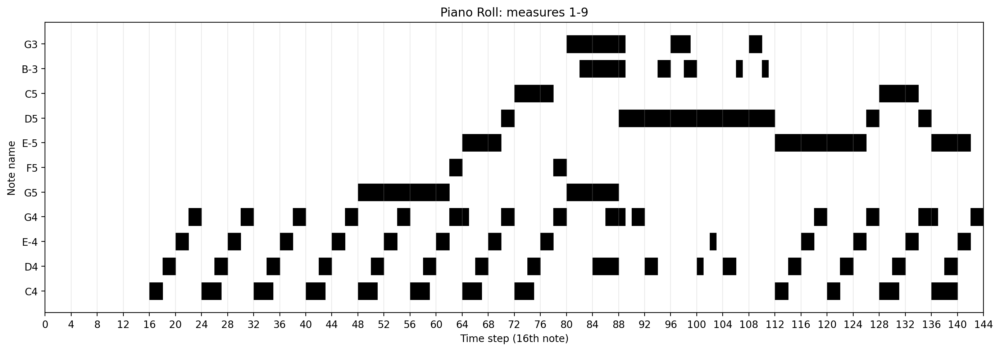

In [15]:
piano_figure, piano_axis = plt.subplots(figsize=(14, 5))
for note in figure_notes.to_dict("records"):
    piano_axis.barh(
        note["note_name"],
        note["duration(steps)"],
        left=note["relative(step)"],
        height=0.7,
        color="black",
        edgecolor="black",
        linewidth=0.3,
    )

note_order = sorted(figure_notes["note_name"].unique(), key=lambda name: m21.pitch.Pitch(name).midi)
piano_axis.set_yticks(note_order)
piano_axis.set_xlim(0, FIGURE_MEASURE_COUNT * STEPS_PER_BAR)
piano_axis.set_xlabel("Time step (16th note)")
piano_axis.set_ylabel("Note name")
piano_axis.set_title(f"Piano Roll: measures {FIGURE_START_MEASURE}-{FIGURE_START_MEASURE + FIGURE_MEASURE_COUNT - 1}")
piano_axis.set_xticks(np.arange(0, FIGURE_MEASURE_COUNT * STEPS_PER_BAR+1, 4))
piano_axis.grid(axis="x", alpha=0.25)
piano_figure.tight_layout()
plt.show()

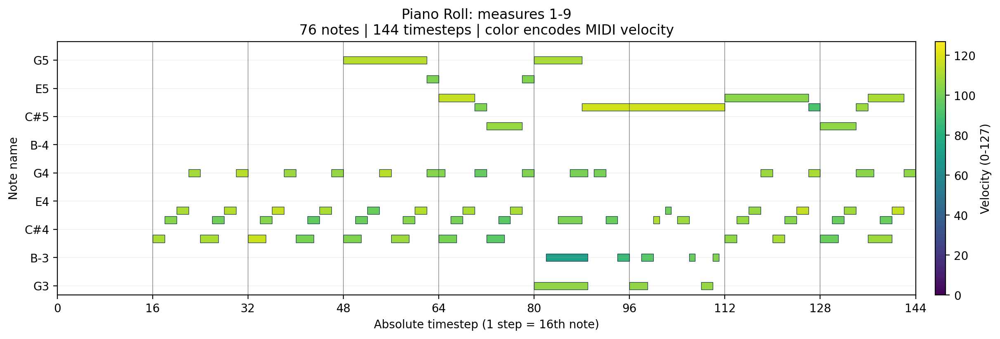

In [16]:
symbolic_notes = figure_notes.to_dict("records")
total_symbolic_steps = FIGURE_MEASURE_COUNT * STEPS_PER_BAR

note_order = sorted(
    figure_notes["note_name"].unique(),
    key=lambda name: m21.pitch.Pitch(name).midi,
)

rectangles = [
    Rectangle((note["relative(step)"],
               m21.pitch.Pitch(note["note_name"]).midi - 0.4,
               ),
               note["duration(steps)"],
               0.8,
    )
    for note in symbolic_notes
]

velocities = np.array(
    [note["velocity"] for note in symbolic_notes],
    dtype=float,
)

fig, ax = plt.subplots(
    figsize=(12, 4),
    constrained_layout=True,
)

collection = PatchCollection(
    rectangles,
    cmap="viridis",
    edgecolor="#17324d",
    linewidth=0.45,
)

collection.set_array(velocities)
collection.set_clim(0, 127)
ax.add_collection(collection)

for step in range(0, total_symbolic_steps + 1, STEPS_PER_BAR):
    ax.axvline(step,
               color="#263238",
               linewidth=0.7,
               alpha=0.45,
    )

pitch_values = [m21.pitch.Pitch(note_name).midi
                for note_name in note_order
]

pitch_ticks = np.arange(
    min(pitch_values),
    max(pitch_values) + 1,
    3,
)

ax.set(
    xlim=(0, total_symbolic_steps),
    ylim=(pitch_ticks[0] - 1, pitch_ticks[-1] + 2),
    xticks=np.arange(
        0,
        total_symbolic_steps + 1,
        STEPS_PER_BAR,
    ),
    yticks=pitch_ticks,
    yticklabels=[
        m21.pitch.Pitch(midi=pitch).nameWithOctave
        for pitch in pitch_ticks
    ],
    xlabel="Absolute timestep (1 step = 16th note)",
    ylabel="Note name",
    title=(
        f"Piano Roll: measures "
        f"{FIGURE_START_MEASURE}-{FIGURE_START_MEASURE + FIGURE_MEASURE_COUNT - 1}\n"
        f"{len(symbolic_notes)} notes | "
        f"{total_symbolic_steps} timesteps | "
        f"color encodes MIDI velocity"
    ),
)

ax.grid(axis="y", alpha=0.16)

fig.colorbar(
    collection,
    ax=ax,
    pad=0.01,
    aspect=24,
    label="Velocity (0-127)",
)

plt.show()

### 5. Hold/Repeat Representation

In [17]:
grid_steps = math.ceil(ANALYSIS_DURATION / SIXTEENTH_SECONDS)

quantized_events = []
for note in note_events_df.to_dict("records"):
    start_step = int(round(note["start(s)"] / SIXTEENTH_SECONDS))
    duration_steps = max(1, int(round(note["duration(s)"] / SIXTEENTH_SECONDS)))
    quantized_events.append({"start(step)": start_step, 
                             "end(step)": start_step + duration_steps, 
                             "pitch": note["pitch"], 
                             "note_name": note["note_name"]})
    
name_tokens = []
numeric_tokens = []
hold_rows = []
for step in range(grid_steps):
    active = [event for event in quantized_events if event["start(step)"] <= step < event["end(step)"]]
    onsets = sorted([event for event in active if event["start(step)"] == step], key=lambda event: event["pitch"])
    name_token = "+".join(event["note_name"] for event in onsets) if onsets else "_" if active else "r"
    numeric_token = "+".join(str(event["pitch"]) for event in onsets) if onsets else "_" if active else "r"
    name_tokens.append(name_token)
    numeric_tokens.append(numeric_token)
    hold_rows.append({"step": step, 
                      "time(s)": round(step * SIXTEENTH_SECONDS, 3), 
                      "bar": step // STEPS_PER_BAR + 1, 
                      "position_16th": step % STEPS_PER_BAR, "note_names": name_token, "midi_numbers": numeric_token})
hold_repeat_df = pd.DataFrame(hold_rows)
print("Note names:", " ".join(name_tokens))
print("Numeric:   ", " ".join(numeric_tokens))
display(hold_repeat_df)

Note names: r r r r r r r r r r r r r r r r C4 _ D4 _ E-4 _ G4 _ C4 _ D4 _ E-4 _ G4 _ C4 _ D4 _ E-4 _ G4 _ C4 _ D4 _ E-4 _ G4 _ C4+G5 _ D4 _ E-4 _ G4 _ C4 _ D4 _ E-4 _ G4+F5 _ C4+E-5 _ D4 _ E-4 _ G4+D5 _ C4+C5 _ D4 _ E-4 _ G4+F5 _ G3+G5 _ B-3 _ D4 _ G4 _ D5 _ G4 _ D4 _ B-3 _ G3 _ B-3 _ D4 _ E-4 _ D4 _ B-3 _ G3 _ B-3 _ C4+E-5 _ D4 _ E-4 _ G4 _ C4 _ D4 _ E-4 _ G4+D5 _ C4+C5 _ D4 _ E-4 _ G4+D5 _ C4+E-5 _ D4 _ E-4 _ G4 _
Numeric:    r r r r r r r r r r r r r r r r 60 _ 62 _ 63 _ 67 _ 60 _ 62 _ 63 _ 67 _ 60 _ 62 _ 63 _ 67 _ 60 _ 62 _ 63 _ 67 _ 60+79 _ 62 _ 63 _ 67 _ 60 _ 62 _ 63 _ 67+77 _ 60+75 _ 62 _ 63 _ 67+74 _ 60+72 _ 62 _ 63 _ 67+77 _ 55+79 _ 58 _ 62 _ 67 _ 74 _ 67 _ 62 _ 58 _ 55 _ 58 _ 62 _ 63 _ 62 _ 58 _ 55 _ 58 _ 60+75 _ 62 _ 63 _ 67 _ 60 _ 62 _ 63 _ 67+74 _ 60+72 _ 62 _ 63 _ 67+74 _ 60+75 _ 62 _ 63 _ 67 _


,step,time(s),bar,position_16th,note_names,midi_numbers
0,0,0.000,1,0,r,r
1,1,0.125,1,1,r,r
2,2,0.250,1,2,r,r
3,3,0.375,1,3,r,r
4,4,0.500,1,4,r,r
...,...,...,...,...,...,...
139,139,17.375,9,11,_,_
140,140,17.500,9,12,E-4,63
141,141,17.625,9,13,_,_
142,142,17.750,9,14,G4,67


## Complete Thesis Figure

A five-row, two-column figure for measures 3-4. The left column contains score (empty forr now), piano roll, hold/repeat, MIDI-like, and REMI views. The right column contains an empty top cell followed by waveform, chromagram, spectrogram, and mel-spectrogram.

In [18]:
FIGURE_START_MEASURE = 3
FIGURE_MEASURE_COUNT = 2
FIGURE_START_STEP = (FIGURE_START_MEASURE - 1) * STEPS_PER_BAR
FIGURE_END_STEP = FIGURE_START_STEP + FIGURE_MEASURE_COUNT * STEPS_PER_BAR

In [19]:

FIGURE_START_SECONDS = FIGURE_START_STEP * SIXTEENTH_SECONDS
FIGURE_END_SECONDS = FIGURE_END_STEP * SIXTEENTH_SECONDS
FIGURE_DURATION_SECONDS = FIGURE_END_SECONDS - FIGURE_START_SECONDS
audio_start = int(FIGURE_START_SECONDS * sample_rate)
audio_end = int(FIGURE_END_SECONDS * sample_rate)
audio_excerpt = y[audio_start:audio_end]
audio_time = np.arange(len(audio_excerpt)) / sample_rate

print(f"Audio excerpt: measures {FIGURE_START_MEASURE}-{FIGURE_START_MEASURE + FIGURE_MEASURE_COUNT - 1} | "
      f"duration: {FIGURE_DURATION_SECONDS:.2f} seconds ({FIGURE_START_SECONDS:.2f}:{FIGURE_END_SECONDS:.2f}) | "
      f"sample points: {len(audio_excerpt):,}")

Audio excerpt: measures 3-4 | duration: 4.00 seconds (4.00:8.00) | sample points: 176,400


In [20]:
def blocks(axis, values, title, rotation=90, fontsize=8):
    for index, (label, color) in enumerate(values):
        axis.add_patch(Rectangle(
            (index, 0), 0.92, 1,
            facecolor=color, edgecolor="#555555", linewidth=0.6,
        ))
        axis.text(
            index + 0.46, 0.5, label,
            ha="center", va="center", 
            rotation=rotation, 
            fontsize=fontsize,
        )
    axis.set_xlim(0, max(1, len(values)))
    axis.set_ylim(0, 1)
    axis.set_yticks([])
    axis.set_xticks([])
    axis.set_title(title, loc="left", fontweight="bold")
    axis.spines[:].set_visible(False)

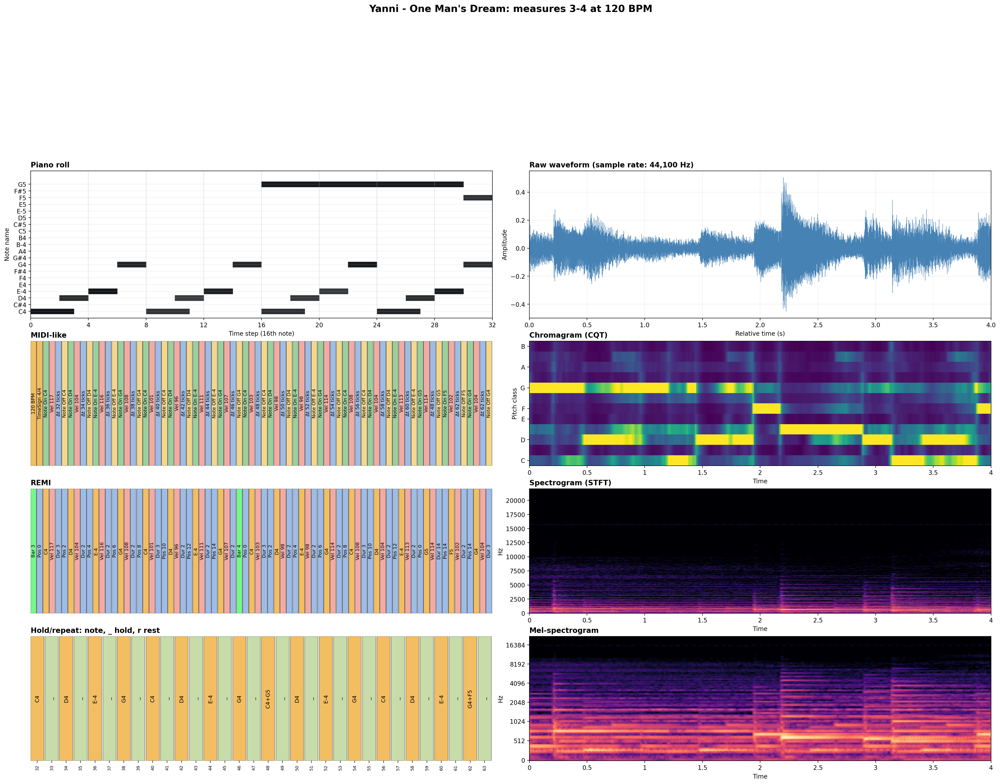

In [22]:
palette = {
    "tempo": "#f3bd61",
    "note_on": "#9bcf9b",
    "velocity": "#f4aaa4",
    "duration": "#9ebce5",
    "note_off": "#f3d78b",
    "hold": "#c7dca8",
    "rest": "#e5e5e5",
    "note": "#f3bd61",
    "bar": "#75f989"
}
figure, axes = plt.subplots(
    5, 2,
    figsize=(24, 20),
    gridspec_kw={"height_ratios": [0.5, 1.3, 1.1, 1.1, 1.1]},
)
axes[0, 0].axis("off")
axes[0, 1].axis("off")

# Piano roll representation
axes[1, 0].set_title("Piano roll", loc="left", fontweight="bold")
axes[1, 0].grid(axis="x", alpha=0.4)
axes[1, 0].grid(axis="y", alpha=0.2)
figure_notes = figure_notes[
    (figure_notes["start(step)"] >= FIGURE_START_STEP)
    & (figure_notes["start(step)"] < FIGURE_END_STEP)
].copy()
figure_notes["relative(step)"] = figure_notes["start(step)"] - FIGURE_START_STEP
symbolic_notes = figure_notes.to_dict("records")
total_symbolic_steps = FIGURE_MEASURE_COUNT * STEPS_PER_BAR
note_order = sorted(
    figure_notes["note_name"].unique(),
    key=lambda name: m21.pitch.Pitch(name).midi,
)
rectangles = [Rectangle(
     (note["relative(step)"],
      m21.pitch.Pitch(note["note_name"]).midi - 0.4
      ),
     note["duration(steps)"],
     0.8,
) for note in symbolic_notes]
velocities = np.array([note["velocity"] 
                       for note in symbolic_notes
                       ], dtype=float)
collection = PatchCollection(
    rectangles,
    cmap="gray_r",
    edgecolor="#0f2f4f",
    linewidth=0.4,
)
collection.set_array(velocities)
collection.set_clim(0, 127)
pitch_values = [m21.pitch.Pitch(note_name).midi
                for note_name in note_order
]
pitch_ticks = np.arange(
    min(pitch_values),
    max(pitch_values) + 1,
    1,
)
axes[1, 0].add_collection(collection)
axes[1, 0].set(
    xlim=(0, total_symbolic_steps),
    ylim=(pitch_ticks[0] - 1, pitch_ticks[-1] + 2),
    xticks=np.arange(
        0,
        total_symbolic_steps + 1,
        STEPS_PER_BAR / 4,
    ),
    yticks=pitch_ticks,
    yticklabels=[
        m21.pitch.Pitch(midi=pitch).nameWithOctave
        for pitch in pitch_ticks
    ],
    xlabel="Time step (16th note)",
    ylabel="Note name",
)
# figure.colorbar(
#     collection,
#     ax=axes[1, 0],
#     pad=0.01,
#     aspect=24,
#     label="Velocity (0-127)",
# )

# MIDI-like representation
midi_blocks = [(f"{BPM} BPM", palette["tempo"]), (f"TimeSign {BEATS_PER_MEASURE}/4", palette["tempo"])]
for note in figure_notes.to_dict("records"):
    midi_blocks.extend([
        (f"Note On {note['note_name']}", palette["note_on"]),
        (f"Vel {note['velocity']}", palette["velocity"]),
        (f"Δt {note['start(step)']} ticks", palette["duration"]),
        (f"Note Off {note['note_name']}", palette["note_off"]),
    ])
blocks(axes[2, 0], midi_blocks, "MIDI-like")

# REMI representation
figure_remi = remi_df[
    (remi_df["bar"] >= FIGURE_START_MEASURE)
    & (remi_df["bar"] <= FIGURE_START_MEASURE + FIGURE_MEASURE_COUNT - 1)
].copy()
remi_blocks = []
current_bar = None
for row in figure_remi.to_dict("records"):
    if row["bar"] != current_bar:
        remi_blocks.append((f"Bar {row['bar']}", palette["bar"]))
        current_bar = row["bar"]
    remi_blocks.extend([
        (f"Pos {row['position_16th']}", palette["duration"]),
        (row["note_name"], palette["note"]),
        (f"Vel {row['velocity']}", palette["velocity"]),
        (f"Dur {row['duration_16ths']}", palette["duration"]),
    ])
blocks(axes[3, 0], remi_blocks, "REMI")

# Hold/repeat representation
figure_hold = hold_repeat_df[
    (hold_repeat_df["step"] >= FIGURE_START_STEP)
    & (hold_repeat_df["step"] < FIGURE_END_STEP)
]
hold_blocks = [
    (
        token,
        palette["hold"] if token == "_"
        else palette["rest"] if token == "r"
        else palette["note"],
    )
    for token in figure_hold["note_names"]
]
blocks(axes[4, 0],
       hold_blocks,
       "Hold/repeat: note, _ hold, r rest",
       fontsize=9,
)
axes[4, 0].set_xticks(np.arange(len(hold_blocks)) + 0.46)
axes[4, 0].set_xticklabels([str(step) for step in figure_hold["step"]], 
                           rotation=90, fontsize=7
)

# Audio excerpt
axes[1, 1].plot(audio_time, audio_excerpt, color="steelblue", linewidth=0.5)
axes[1, 1].set_xlim(0, FIGURE_DURATION_SECONDS)
axes[1, 1].set_xlabel("Relative time (s)")
axes[1, 1].set_ylabel("Amplitude")
axes[1, 1].set_title(
    f"Raw waveform (sample rate: {sample_rate:,} Hz)",
    loc="left", fontweight="bold",
)
axes[1, 1].grid(alpha=0.2)

# Chromagram excerpt
figure_chroma =  librosa.feature.chroma_cqt(y=audio_excerpt, sr=sample_rate, hop_length=HOP_LENGTH)
librosa.display.specshow(figure_chroma, 
                         sr=sample_rate, hop_length=HOP_LENGTH, 
                         x_axis="time", y_axis="chroma", cmap="viridis", ax=axes[2, 1])
axes[2, 1].set_xlim(0, FIGURE_DURATION_SECONDS)
axes[2, 1].set_title("Chromagram (CQT)", loc="left", fontweight="bold")
# figure.colorbar(
#     plt.cm.ScalarMappable(cmap="viridis"),
#     ax=axes[2, 1],
#     pad=0.01,
#     aspect=24,
#     label="Intensity",
# )

# Spectrogram excerpt
figure_spectrogram = librosa.stft(audio_excerpt, n_fft=N_FFT, hop_length=HOP_LENGTH)
figure_spectrogram_db = librosa.amplitude_to_db(np.abs(figure_spectrogram), ref=np.max)
librosa.display.specshow(figure_spectrogram_db, 
                         sr=sample_rate, hop_length=HOP_LENGTH, 
                         x_axis="time", y_axis="hz", cmap="magma", ax=axes[3, 1])
axes[3, 1].set_xlim(0, FIGURE_DURATION_SECONDS)
axes[3, 1].set_title("Spectrogram (STFT)", loc="left", fontweight="bold")
# figure.colorbar(
#     plt.cm.ScalarMappable(cmap="magma"),
#     ax=axes[3, 1],
#     pad=0.01,
#     aspect=24,
#     label="Intensity",
# )

# Mel-spectrogram excerpt
figure_mel_spectrogram = librosa.feature.melspectrogram(y=audio_excerpt, sr=sample_rate, 
                                                        n_fft=N_FFT, hop_length=HOP_LENGTH, 
                                                        n_mels=N_MELS, fmax=sample_rate/2)
figure_mel_spectrogram_db = librosa.power_to_db(figure_mel_spectrogram, ref=np.max)
librosa.display.specshow(figure_mel_spectrogram_db, 
                         sr=sample_rate, hop_length=HOP_LENGTH, 
                         x_axis="time", y_axis="mel", cmap="magma", ax=axes[4, 1])
axes[4, 1].set_xlim(0, FIGURE_DURATION_SECONDS)
axes[4, 1].set_title("Mel-spectrogram", loc="left", fontweight="bold")
# figure.colorbar(
#     plt.cm.ScalarMappable(cmap="magma"),
#     ax=axes[4, 1],
#     pad=0.01,
#     aspect=24,
#     label="Power",
# )

for row in range(5):
    left = axes[row, 0].get_position()
    right = axes[row, 1].get_position()
    axes[row, 0].set_position([0.04, left.y0, 0.56, left.height])
    axes[row, 1].set_position([0.64, right.y0, 0.32, right.height])
figure.suptitle(
    f"Yanni - One Man's Dream: measures 3-4 at {BPM} BPM",
    fontsize=16, fontweight="bold",
)
figure.subplots_adjust(left=0.04, right=0.96, wspace=0.08)
plt.show()